# Libraries

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px
import geopandas as gpd
import shapely as shp
from shapely.geometry import Polygon, LineString

import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

# Preparing the Data

In [4]:
df = pd.read_csv("Electric_Vehicle_Population_Data.csv")
df.head(5)

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJ3E1EBXK,King,Seattle,WA,98178.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,0.0,37.0,477309682,POINT (-122.23825 47.49461),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
1,5YJYGDEE3L,Kitsap,Poulsbo,WA,98370.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,0.0,23.0,109705683,POINT (-122.64681 47.73689),PUGET SOUND ENERGY INC,5.303509e+10
2,KM8KRDAF5P,Kitsap,Olalla,WA,98359.0,2023,HYUNDAI,IONIQ 5,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,26.0,230390492,POINT (-122.54729 47.42602),PUGET SOUND ENERGY INC,5.303509e+10
3,5UXTA6C0XM,Kitsap,Seabeck,WA,98380.0,2021,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,30.0,0.0,35.0,267929112,POINT (-122.81585 47.64509),PUGET SOUND ENERGY INC,5.303509e+10
4,JTMAB3FV7P,Thurston,Rainier,WA,98576.0,2023,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42.0,0.0,2.0,236505139,POINT (-122.68993 46.88897),PUGET SOUND ENERGY INC,5.306701e+10


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235692 entries, 0 to 235691
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         235692 non-null  object 
 1   County                                             235689 non-null  object 
 2   City                                               235689 non-null  object 
 3   State                                              235692 non-null  object 
 4   Postal Code                                        235689 non-null  float64
 5   Model Year                                         235692 non-null  int64  
 6   Make                                               235692 non-null  object 
 7   Model                                              235692 non-null  object 
 8   Electric Vehicle Type                              235692 non-null  object

In [6]:
#Number of Columns
len(df.columns)

17

In [7]:
df.shape

(235692, 17)

# Cleaning Missing Data

In [9]:
#Missing Data Count
miss = df.isna().sum()
miss

VIN (1-10)                                             0
County                                                 3
City                                                   3
State                                                  0
Postal Code                                            3
Model Year                                             0
Make                                                   0
Model                                                  0
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                        36
Base MSRP                                             36
Legislative District                                 494
DOL Vehicle ID                                         0
Vehicle Location                                      10
Electric Utility                                       3
2020 Census Tract                                      3
dtype: int64

<Axes: >

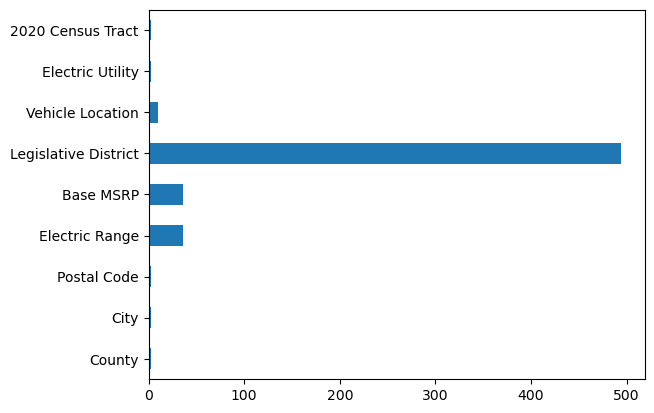

In [10]:
miss[miss >= 1].plot(kind = 'barh')

**Therefore from the give dataset we can see that there are more number of missing values in the Legislative District**

In [12]:
# Remove rows where essential location-related fields are missing
df_cleaned = df.dropna(subset=['County', 'City', 'Postal Code', 'Vehicle Location', 'Electric Utility', 'Legislative District'])
miss = df_cleaned.isna().sum()
miss

VIN (1-10)                                            0
County                                                0
City                                                  0
State                                                 0
Postal Code                                           0
Model Year                                            0
Make                                                  0
Model                                                 0
Electric Vehicle Type                                 0
Clean Alternative Fuel Vehicle (CAFV) Eligibility     0
Electric Range                                       36
Base MSRP                                            36
Legislative District                                  0
DOL Vehicle ID                                        0
Vehicle Location                                      0
Electric Utility                                      0
2020 Census Tract                                     0
dtype: int64

**Here we are removing the values we cannot impute because their values are very critical.**

<Axes: >

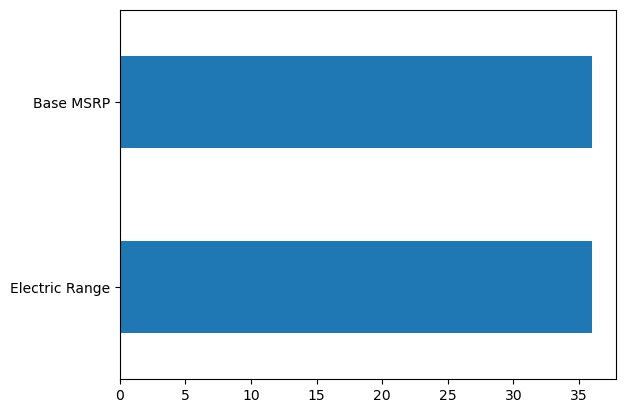

In [14]:
miss[miss >= 1].plot(kind = 'barh')

**Still Here we find that there are missing values present in Base MSRP and Electric Range**

In [16]:
df.shape

(235692, 17)

**Here we can see that we did'nt loose too many rows.**

In [18]:
# Ensure df_cleaned is a separate copy to avoid SettingWithCopyWarning
df_cleaned = df_cleaned.copy()

# Calculate mean excluding zero values
mean_base_msrp = df_cleaned.loc[df_cleaned['Base MSRP'] > 0, 'Base MSRP'].mean()

# Replace 0 and NaN values with the calculated mean
df_cleaned.loc[:, 'Base MSRP'] = df_cleaned['Base MSRP'].replace(0, np.nan)  # Convert 0s to NaN
df_cleaned.loc[:, 'Base MSRP'] = df_cleaned['Base MSRP'].fillna(mean_base_msrp)  # Fill NaNs with mean

print(f"Mean Base MSRP (excluding zeros): {mean_base_msrp}")

Mean Base MSRP (excluding zeros): 57013.210428879975


In [19]:
df.shape

(235692, 17)

In [20]:
miss = df_cleaned.isna().sum()
miss

VIN (1-10)                                            0
County                                                0
City                                                  0
State                                                 0
Postal Code                                           0
Model Year                                            0
Make                                                  0
Model                                                 0
Electric Vehicle Type                                 0
Clean Alternative Fuel Vehicle (CAFV) Eligibility     0
Electric Range                                       36
Base MSRP                                             0
Legislative District                                  0
DOL Vehicle ID                                        0
Vehicle Location                                      0
Electric Utility                                      0
2020 Census Tract                                     0
dtype: int64

<Axes: >

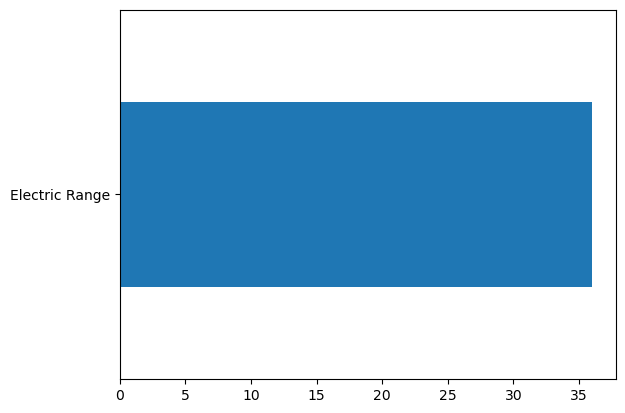

In [21]:
miss[miss >= 1].plot(kind = 'barh')

**Here we are replacing the Base MSRP with the mean of the data, Excluding the zeroes to get an accurate mean value.**
**We did not loose many rows in this operation.**
**Now we have only 36 missing Values in Electric Range**

In [23]:
df_cleaned = df_cleaned[df_cleaned['Electric Range'] > 0]  # Ensure only positive numbers

In [24]:
df_cleaned.shape

(95654, 17)

**Here we are ensuring we have only positive values so that we can have an accurate data.**
**But we lost a lot of rows in this operation.**

In [26]:
df_cleaned.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJ3E1EBXK,King,Seattle,WA,98178.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,57013.210429,37.0,477309682,POINT (-122.23825 47.49461),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
1,5YJYGDEE3L,Kitsap,Poulsbo,WA,98370.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,57013.210429,23.0,109705683,POINT (-122.64681 47.73689),PUGET SOUND ENERGY INC,5.303509e+10
3,5UXTA6C0XM,Kitsap,Seabeck,WA,98380.0,2021,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,30.0,57013.210429,35.0,267929112,POINT (-122.81585 47.64509),PUGET SOUND ENERGY INC,5.303509e+10
4,JTMAB3FV7P,Thurston,Rainier,WA,98576.0,2023,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42.0,57013.210429,2.0,236505139,POINT (-122.68993 46.88897),PUGET SOUND ENERGY INC,5.306701e+10
5,5YJSA1DN0C,Thurston,Olympia,WA,98502.0,2012,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,265.0,59900.000000,22.0,186637195,POINT (-122.92333 47.03779),PUGET SOUND ENERGY INC,5.306701e+10


In [27]:
df_cleaned.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [28]:
miss = df_cleaned.isna().sum()
miss

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

**Here all the na values are removed, but there are still null values present in the data**

## Cleaning Extra Null Electric Range Data and Base MSRP Data and Legislative District Data

In [31]:
print(df[['Electric Range', 'Legislative District', 'Base MSRP']].isnull().sum())

Electric Range           36
Legislative District    494
Base MSRP                36
dtype: int64


**As we can see that there are lot of null values in the df_cleaned database.**

In [33]:
mean_electric_range = df.loc[df['Electric Range'] > 0, 'Electric Range'].mean()
df.loc[:, 'Electric Range'] = df['Electric Range'].fillna(mean_electric_range)

In [34]:
median_legis_district = df['Legislative District'].median()
df.loc[:, 'Legislative District'] = df['Legislative District'].fillna(median_legis_district)

In [35]:
mean_base_msrp = df.loc[df['Base MSRP'] > 0, 'Base MSRP'].mean()
df.loc[:, 'Base MSRP'] = df['Base MSRP'].fillna(mean_base_msrp)

In [36]:
print(df[['Electric Range', 'Legislative District', 'Base MSRP']].isnull().sum())

Electric Range          0
Legislative District    0
Base MSRP               0
dtype: int64


**So we are imputing the null values and the Zero values using Mean for Electric Range and Base MSRP and Median for Legislative District, so that we dont have incorrect data in the database.**

**As we can see that Now there are no missing data present in the Database.**

In [38]:
df_cleaned.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,95654.000000,95654.000000,95654.000000,95654.000000,95654.000000,9.565400e+04,9.565400e+04
mean,98295.255295,2019.080038,113.697629,57013.210429,28.463337,2.238388e+08,5.304002e+10
std,323.065707,3.344205,98.440764,4217.392624,14.633979,9.715253e+07,1.697534e+07
min,98001.000000,2000.000000,6.000000,31950.000000,1.000000,4.385000e+03,5.300195e+10
25%,98058.000000,2017.000000,30.000000,57013.210429,17.000000,1.561483e+08,5.303301e+10
50%,98177.000000,2019.000000,72.000000,57013.210429,32.000000,2.336736e+08,5.303303e+10
75%,98406.000000,2022.000000,215.000000,57013.210429,41.000000,2.692960e+08,5.305307e+10
max,99403.000000,2025.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.307794e+10


**The Statistics clearly show that the data is almost going in the correct Direction.**

# Outlier Analysis

## IQR Analysis on the Data (Statistical)

In [67]:
# Compute Q1, Q3, IQR, Lower Bound, Upper Bound for 'Electric Range' and 'Legislative District'
q1_range = df['Electric Range'].quantile(0.25)
q3_range = df['Electric Range'].quantile(0.75)
iqr_range = q3_range - q1_range

q1_legislative = df['Legislative District'].quantile(0.25)
q3_legislative = df['Legislative District'].quantile(0.75)
iqr_legislative = q3_legislative - q1_legislative

print("Electric Range Data: ")
print("Quartile 1: ", q1_range)
print("Quartile 3: ", q3_range)
print("IQR: ", iqr_range)
print("Lower Bound: ", q1_range - 1.5*(iqr_range))
print("Upper Bound:: ", q3_range + 1.5*(iqr_range))
print("")
print("Legislative Range Data: ")
print("Quartile 1: ", q1_legislative)
print("Quartile 3: ", q3_legislative)
print("IQR: ", iqr_legislative)
print("Lower Bound: ", q1_legislative - 1.5*(iqr_legislative))
print("Upper Bound:: ", q3_legislative + 1.5*(iqr_legislative))

Electric Range Data: 
Quartile 1:  0.0
Quartile 3:  38.0
IQR:  38.0
Lower Bound:  -57.0
Upper Bound::  95.0

Legislative Range Data: 
Quartile 1:  17.0
Quartile 3:  42.0
IQR:  25.0
Lower Bound:  -20.5
Upper Bound::  79.5


**From the given IQR Data we can fetch the outliers, by the Lower Bound and Upper Bound.**

**IQR = Q3 - Q1**

**Lower Bound = Q1 - 1.5 x IQR**

**Upper Bound  = Q3 + 1.5 x IQR**

## Graphical Outlier Analysis

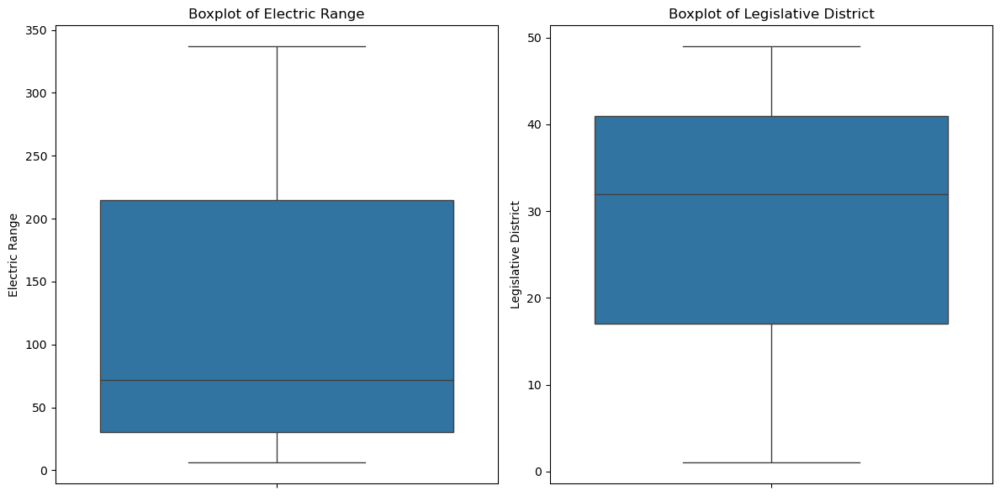

In [74]:
# List of numerical columns to analyze
num_cols = ['Electric Range', 'Legislative District']

#nBoxplot - Detecting Outliers
plt.figure(figsize=(12, 6))
for i, col in enumerate(num_cols, 1):
    plt.subplot(1, len(num_cols), i)
    sns.boxplot(y=df_cleaned[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

**From the Box Plot we can see that there are no outliers present in the given dataset.**

# Hierarchial Clustering (Dendogram)

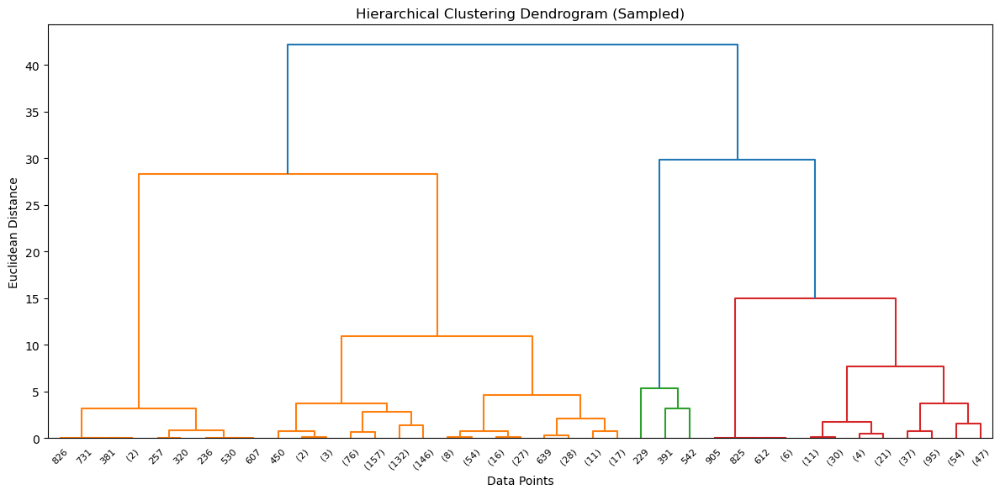

In [80]:
# Sample 1000 rows for dendrogram visualization
df_sampled = df_cleaned.sample(n=1000, random_state=42)

# Re-run scaling and dendrogram on the sample
X_sampled = df_sampled[['Base MSRP', 'Electric Range']]
X_scaled_sampled = scaler.fit_transform(X_sampled)

linked = linkage(X_scaled_sampled, method='ward')

plt.figure(figsize=(12, 6))
dendrogram(linked, truncate_mode='level', p=5)
plt.title('Hierarchical Clustering Dendrogram (Sampled)')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.tight_layout()
plt.show()


**So here we can have atmost 4 clusters, to confirm we can use K - Means Clustering**

# K Means Clustering

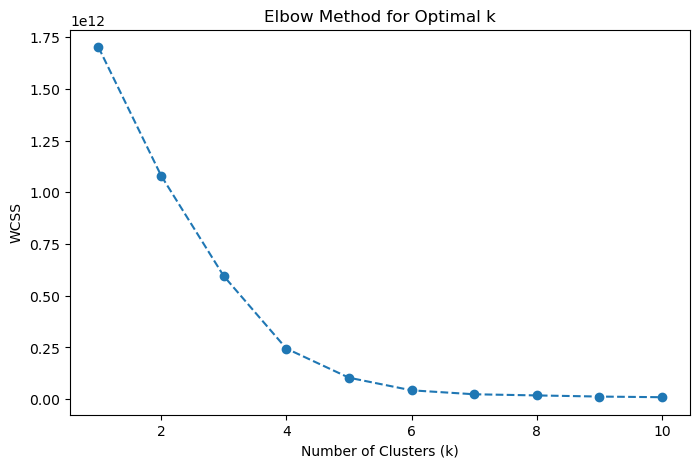

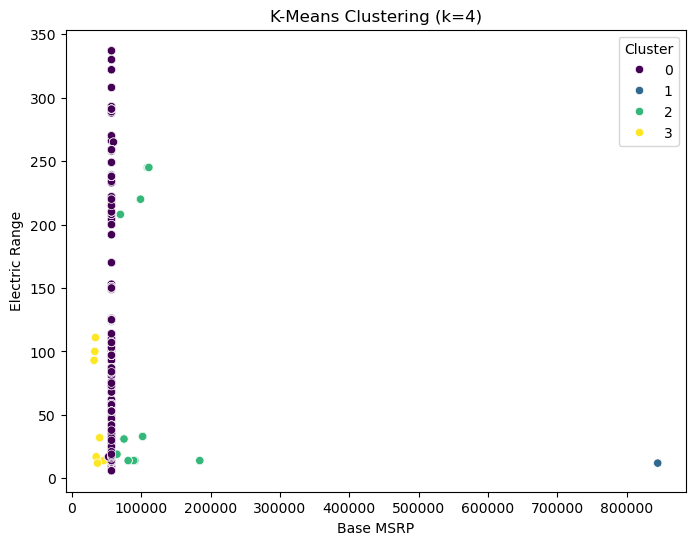

WCSS (Within-Cluster Sum of Squares) measures the compactness of the clusters in K-Means clustering. It calculates the sum of squared distances between each data point and the centroid of its assigned cluster.


In [82]:
# Selecting relevant features for clustering
X = df_cleaned[['Base MSRP', 'Electric Range']]

# Finding the optimal number of clusters using the Elbow Method
wcss = []  # Within-Cluster Sum of Squares
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Plot Elbow Method to find the best k
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method for Optimal k')
plt.show()

# Apply K-Means with optimal k (choose based on Elbow Method)
optimal_k = 4  # Adjust based on the elbow method plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_cleaned['Cluster'] = kmeans.fit_predict(X)

# Visualizing clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_cleaned['Base MSRP'], y=df_cleaned['Electric Range'], hue=df_cleaned['Cluster'], palette='viridis')
plt.xlabel('Base MSRP')
plt.ylabel('Electric Range')
plt.title(f'K-Means Clustering (k={optimal_k})')
plt.legend(title='Cluster')
plt.show()

print("WCSS (Within-Cluster Sum of Squares) measures the compactness of the clusters in K-Means clustering. It calculates the sum of squared distances between each data point and the centroid of its assigned cluster.")

**From the K - Means Clustering using the elbow method, we can say that only 4 clusters are possible.**

# Statistical Analysis

## Basic Statistics

In [85]:
# Ensure df_cleaned is defined and select only numerical columns excluding 'Cluster'
numeric_df = df_cleaned.select_dtypes(include=['number']).drop(columns=['Cluster'], errors='ignore')

# Generate descriptive statistics
stats_summary = numeric_df.describe()

# Display the statistics summary
stats_summary

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,95654.000000,95654.000000,95654.000000,95654.000000,95654.000000,9.565400e+04,9.565400e+04
mean,98295.255295,2019.080038,113.697629,57013.210429,28.463337,2.238388e+08,5.304002e+10
std,323.065707,3.344205,98.440764,4217.392624,14.633979,9.715253e+07,1.697534e+07
min,98001.000000,2000.000000,6.000000,31950.000000,1.000000,4.385000e+03,5.300195e+10
25%,98058.000000,2017.000000,30.000000,57013.210429,17.000000,1.561483e+08,5.303301e+10
50%,98177.000000,2019.000000,72.000000,57013.210429,32.000000,2.336736e+08,5.303303e+10
75%,98406.000000,2022.000000,215.000000,57013.210429,41.000000,2.692960e+08,5.305307e+10
max,99403.000000,2025.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.307794e+10


In [86]:
# Additional statistics for numerical columns excluding 'Cluster'
more_stats = numeric_df.agg(['median', 'var', 'skew', 'kurt'])

# Display additional statistics
more_stats

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
median,98177.000000,2019.000000,72.000000,5.701321e+04,32.000000,2.336736e+08,5.303303e+10
var,104371.451201,11.183708,9690.584085,1.778640e+07,214.153335,9.438615e+15,2.881620e+14
skew,1.630600,-0.173242,0.601476,7.098953e+01,-0.366042,4.373220e-01,2.150843e-01
kurt,2.203023,-0.544738,-1.217125,1.284827e+04,-1.155690,1.136887e+00,-5.482780e-01


## Correlation Matrix

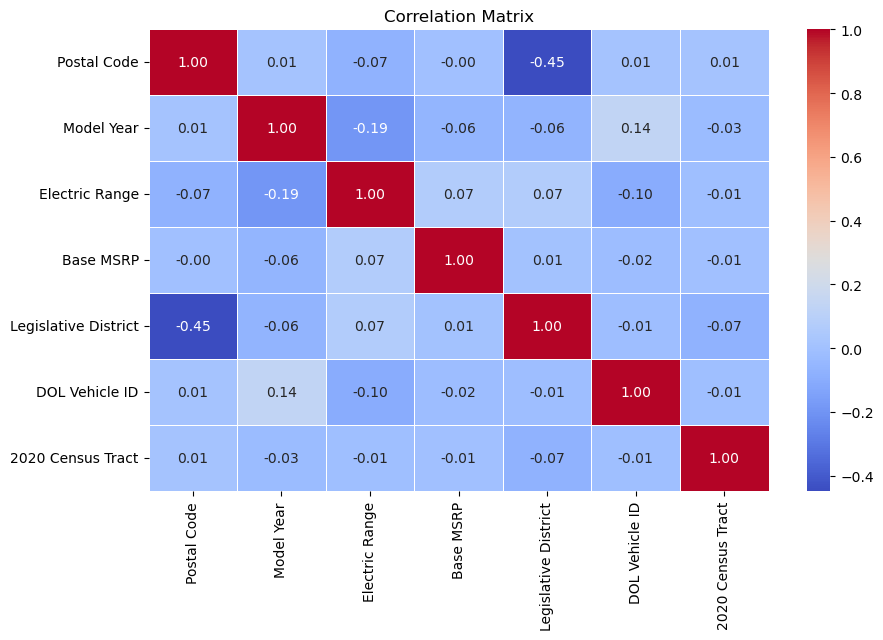

In [88]:
# Ensure df_cleaned is defined and select only numerical columns excluding 'Cluster'
numeric_df = df_cleaned.select_dtypes(include=['number']).drop(columns=['Cluster'], errors='ignore')

# Compute correlation matrix
corr_matrix = numeric_df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Customize plot
plt.title("Correlation Matrix")
plt.show()

**Here in the given Correlation Matrix, None of the Variables are Correlated to each other. But Legislative District and Postol code has somewhat weak negative correlation of -0.45**

## Skewness

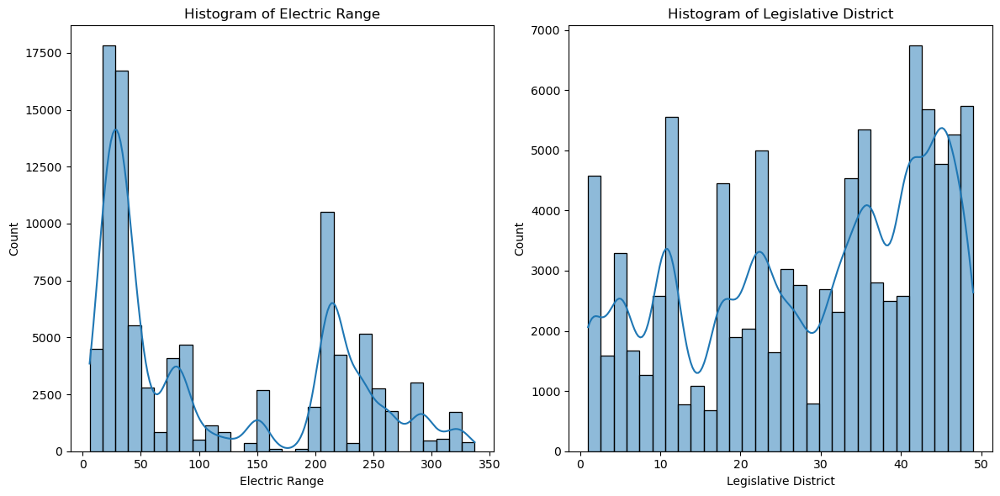

In [90]:
plt.figure(figsize=(12, 6))

num_cols = ['Electric Range', 'Legislative District']

for i, col in enumerate(num_cols, 1):
    plt.subplot(1, len(num_cols), i)    
    sns.histplot(df_cleaned[col], bins=30, kde=True)
    plt.title(f'Histogram of {col}')
    
    plt.xlabel(col)
    plt.ylabel('Count')
    
    # Set custom x-axis limit only for 'Base MSRP'
    if col == 'Base MSRP':
        plt.xlim(350, df_cleaned['Base MSRP'].max())  # Focus on values > 350

plt.tight_layout()
plt.show()

**Here Electric Range is Left Skewed and Legislative district is Right Skewed.**

## Kurtosis

Kurtosis of Electric Range: -1.2171244839066289
Kurtosis of Legislative District: -1.1556927407048978
Kurtosis of Base MSRP: 12847.596948024126


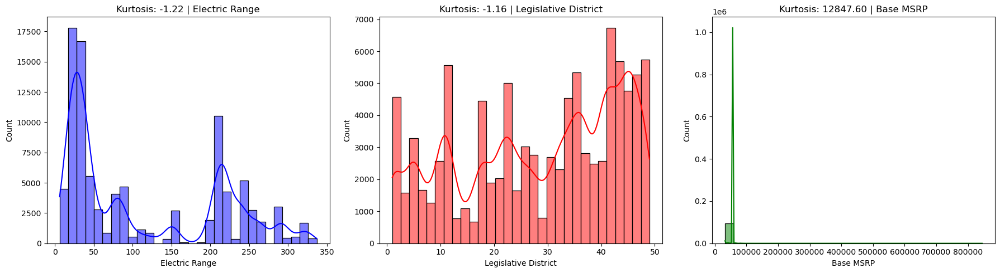

In [95]:
from scipy.stats import kurtosis

# Calculate kurtosis values
kurt_electric = kurtosis(df_cleaned['Electric Range'])
kurt_legis = kurtosis(df_cleaned['Legislative District'])
kurt_msrp = kurtosis(df_cleaned['Base MSRP'])

print(f"Kurtosis of Electric Range: {kurt_electric}")
print(f"Kurtosis of Legislative District: {kurt_legis}")
print(f"Kurtosis of Base MSRP: {kurt_msrp}")

# Plot distributions with KDE curves in a 1-row, 3-column layout
plt.figure(figsize=(18, 5))

# Electric Range
plt.subplot(1, 3, 1)
sns.histplot(df_cleaned['Electric Range'], kde=True, bins=30, color='blue')
plt.title(f'Kurtosis: {kurt_electric:.2f} | Electric Range')

# Legislative District
plt.subplot(1, 3, 2)
sns.histplot(df_cleaned['Legislative District'], kde=True, bins=30, color='red')
plt.title(f'Kurtosis: {kurt_legis:.2f} | Legislative District')

# Base MSRP
plt.subplot(1, 3, 3)
sns.histplot(df_cleaned['Base MSRP'], kde=True, bins=30, color='green')
plt.title(f'Kurtosis: {kurt_msrp:.2f} | Base MSRP')

plt.tight_layout()
plt.show()


**1. Electric Range**
Kurtosis: -1.217

Interpretation:
This is platykurtic, indicating a flatter distribution than a normal distribution.

Implication:
The distribution of electric range values has light tails and fewer extreme outliers than a normal distribution. Most electric range values are clustered near the mean.

**2. Legislative District**
Kurtosis: -1.156

Interpretation:
Also platykurtic, with a flat distribution.

Implication:
The legislative district data is relatively evenly spread, with fewer districts showing extreme or unusually high representation.



**3. Base MSRP**
Kurtosis: 12847.597

Interpretation:
This is extremely leptokurtic, indicating a very sharp peak and very heavy tails.

Implication:
The Base MSRP (base price) values are highly concentrated near the center, but there are many extreme outliers (very expensive vehicles) present in the data. This suggests significant price disparity among vehicle models.

## Which of the Columns are Normally Distributed and also the Poisson Distribution
**Histogram**

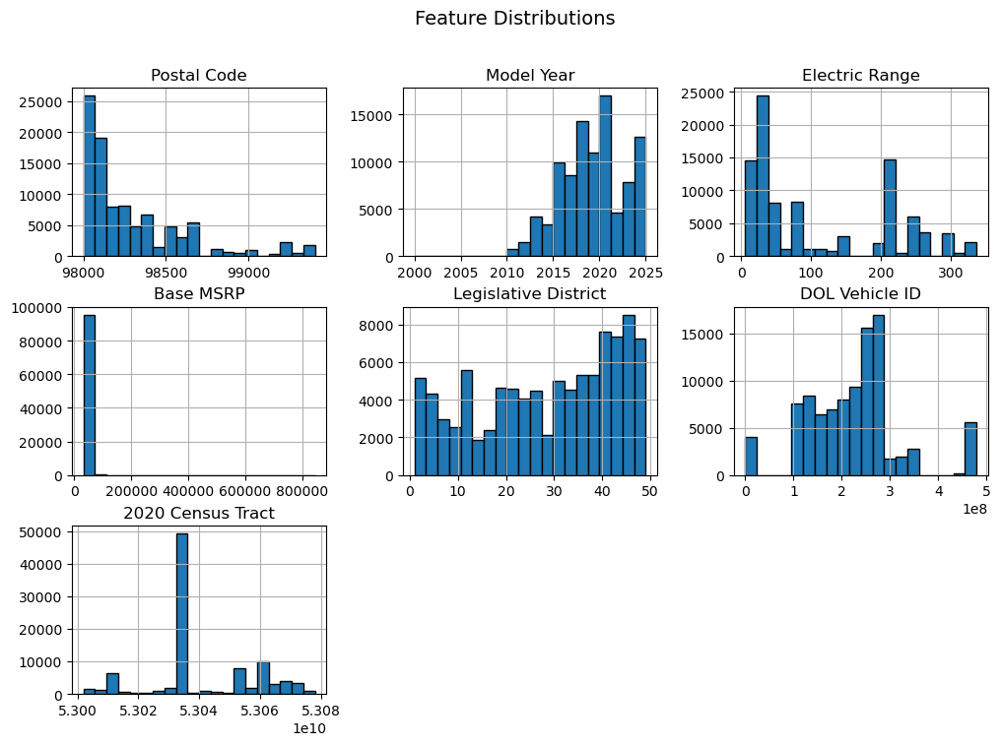

In [102]:
#Histograms
numeric_df.hist(figsize=(12, 8), bins=20, edgecolor='black')
plt.suptitle("Feature Distributions", fontsize=14)
plt.show()

# EDA Analysis

## Which countries use more number of electrics in Visually?
**Heatmap of Washington State**

In [107]:
# Reading the Shapefile
shape = gpd.read_file("WA_County_Boundaries.shp")

In [108]:
# Aggregate EV counts per county
ev_county = df_cleaned.groupby("County").size().reset_index(name="EV Count")

In [109]:
shape = shape.merge(ev_county, left_on="JURISDIC_2", right_on="County", how="left").fillna(0).infer_objects(copy=False)
pd.set_option('future.no_silent_downcasting', True)

C:\Users\sj206\AppData\Local\Temp\ipykernel_13852\2060871931.py:1: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  shape = shape.merge(ev_county, left_on="JURISDIC_2", right_on="County", how="left").fillna(0).infer_objects(copy=False)


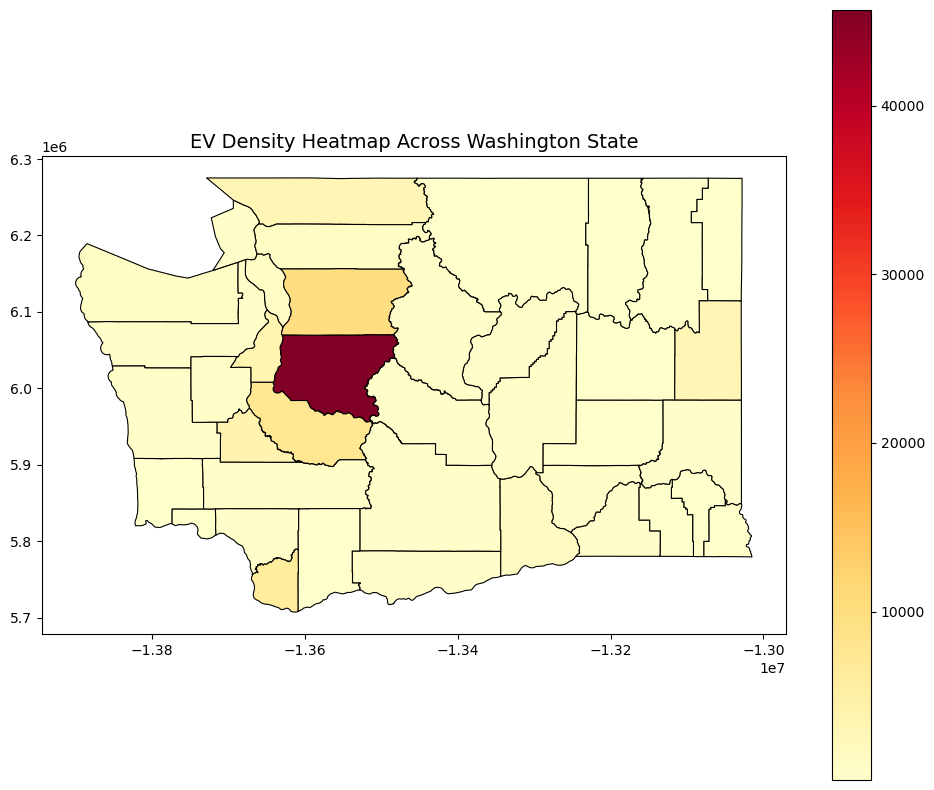

In [110]:
# Heatmap
fig, ax = plt.subplots(figsize=(12, 10))
shape.plot(column="EV Count", cmap="YlOrRd", linewidth=0.8, edgecolor="black", legend=True, ax=ax)
ax.set_title("EV Density Heatmap Across Washington State", fontsize=14)
plt.show()

**Here we can see that the King State has highest number of Electric Vehicles.**

## Who are the 10 Top Countries in usage of Most EV'S?
**Horizontal Bar Graph**

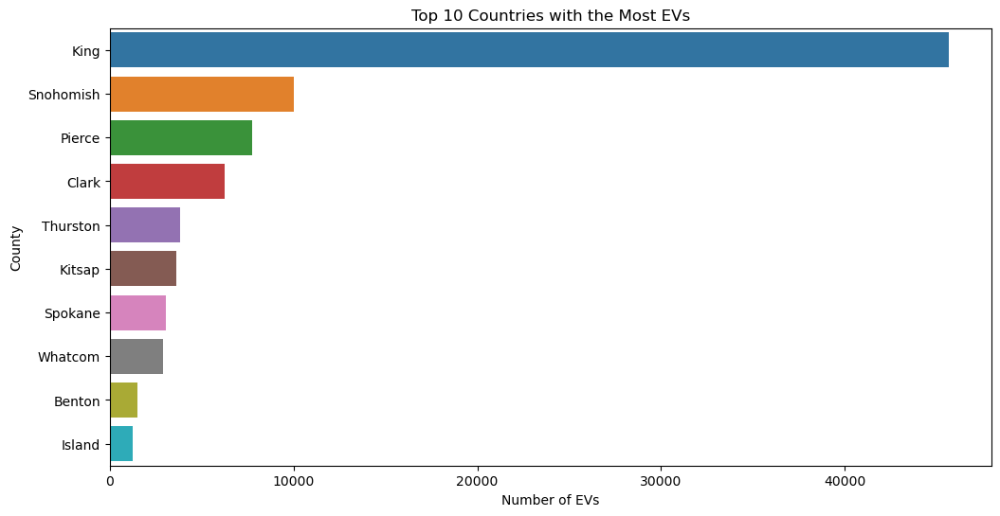

In [116]:
top_counties = ev_county.sort_values(by="EV Count", ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x="EV Count", y="County", data=top_counties, hue="County", palette="tab10", legend=False)
plt.title("Top 10 Countries with the Most EVs")
plt.xlabel("Number of EVs")
plt.ylabel("County")
plt.show()

**From the given Interpretation we can say that 'King' Country has Highest Number of Electric Vehicles**

## What are the Top 5 and Bottom 5 Car Models?
**Vertical Bar Graph**

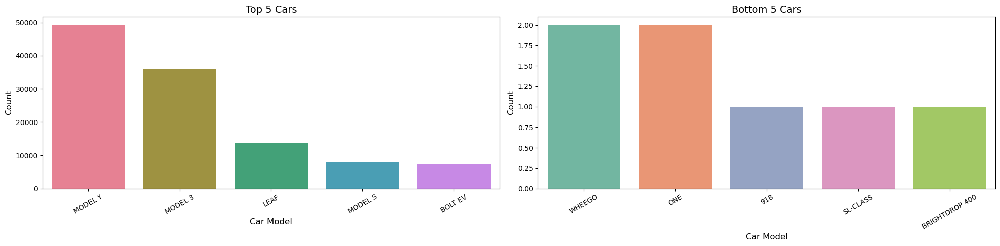

In [120]:
# Count occurrences of each car model
car_market_share = df['Model'].value_counts().reset_index()
car_market_share.columns = ['model', 'count']

# Get the top 5 and bottom 5 models
car_market_share_top_5 = car_market_share.head(5)
car_market_share_bottom_5 = car_market_share.tail(5)

# Create color palettes
top_palette = sns.color_palette("husl", len(car_market_share_top_5))
bottom_palette = sns.color_palette("Set2", len(car_market_share_bottom_5))

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 5))

# Top 5 Cars
sns.barplot(data=car_market_share_top_5, x="model", y="count", ax=axes[0], hue="model", palette=top_palette, legend=False)
axes[0].set_title('Top 5 Cars', fontsize=14)
axes[0].set_xlabel("Car Model", fontsize=12)
axes[0].set_ylabel("Count", fontsize=12)
axes[0].tick_params(axis='x', rotation=30)

# Bottom 5 Cars
sns.barplot(data=car_market_share_bottom_5, x="model", y="count", ax=axes[1], hue="model", palette=bottom_palette, legend=False)
axes[1].set_title('Bottom 5 Cars', fontsize=14)
axes[1].set_xlabel("Car Model", fontsize=12)
axes[1].set_ylabel("Count", fontsize=12)
axes[1].tick_params(axis='x', rotation=30)

plt.tight_layout()
plt.show()

**The most popular EVs in Washington are Tesla Model Y and Model 3, with registrations nearing 50,000 and 36,000 respectively. In contrast, rare models like WHEEGO and BRIGHTDROP 400 have minimal presence, with only 1–2 registrations each.**

## How has growth of EV'S Expanded over the years in Washington State?
**Mixed Histogram and Line Graph**

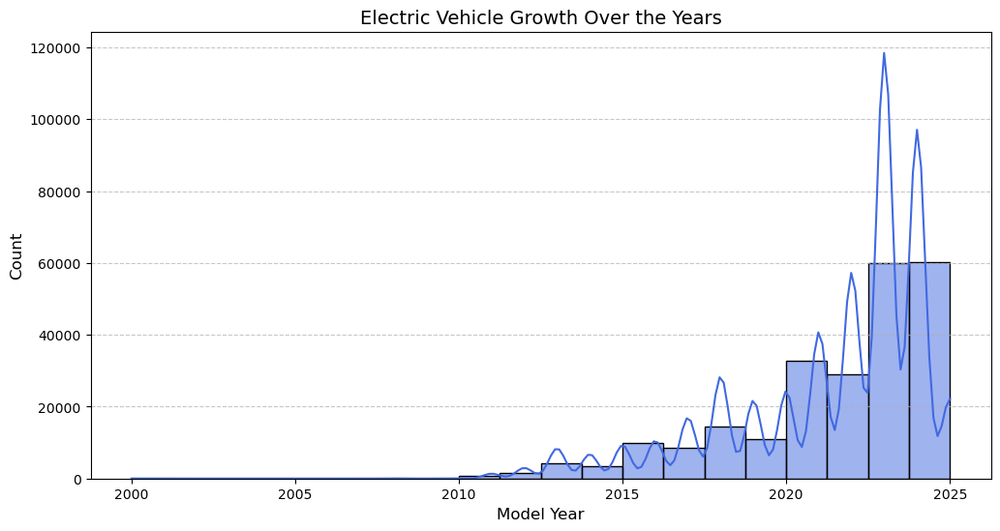

In [123]:
# Create the histogram with a colorful gradient
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x="Model Year", bins=20, kde=True, color="royalblue")

# Customize appearance
plt.title("Electric Vehicle Growth Over the Years", fontsize=14)
plt.xlabel("Model Year", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

**The chart shows a significant rise in electric vehicle counts starting around 2015, with sharp growth peaking between 2022 and 2024. This indicates rapid adoption of EVs in recent years.**

## Which Countries use BEV (Battery Electric Vehicls), PHEV (Plug In Hybric Electric Vehicles), Both BEV and PHEV?
**Stacked Bar Graph**

<Figure size 1400x700 with 0 Axes>

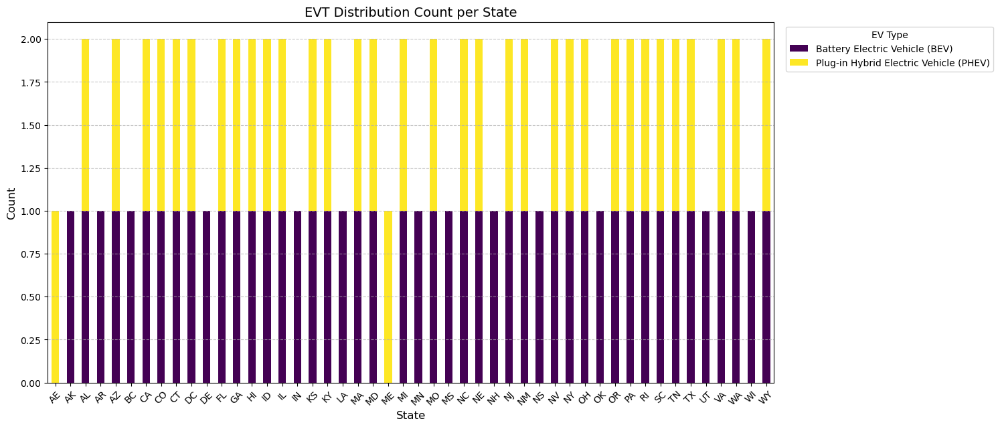

In [125]:
evt_Dis_cnt = df.groupby(['State', 'Electric Vehicle Type']).size().reset_index(name='Count')
custom_palette = sns.color_palette("viridis", n_colors=len(evt_Dis_cnt["Electric Vehicle Type"].unique()))

# Create the stacked bar chart
plt.figure(figsize=(14, 7))
evt_Dis_cnt.groupby(['State', 'Electric Vehicle Type'])['Count'].count().unstack().plot(
    kind='bar', stacked=True, colormap='viridis', figsize=(14, 7)
)

# Customize the legend and appearance
plt.legend(title="EV Type", bbox_to_anchor=(1.01, 1), loc='upper left')
plt.title("EVT Distribution Count per State", fontsize=14)
plt.xlabel("State", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

**The bar chart shows that every state has 1 count each of Battery Electric Vehicles (BEVs) and Plug-in Hybrid Electric Vehicles (PHEVs), indicating an even distribution. The total count per state is consistently 2, split between the two EV types.**

## Which Company's Cars have a Good Mileage (The Range of the Vehicles can travel in KM)?
**Pie Chart**

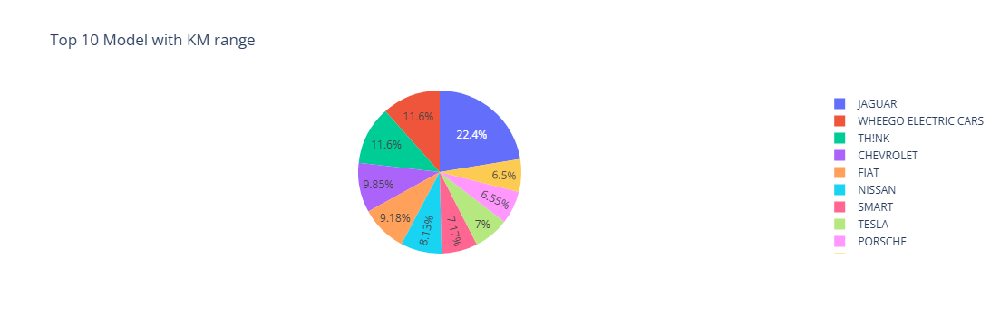

In [127]:
km_range = pd.DataFrame(df.groupby('Make')['Electric Range'].mean().reset_index()).sort_values(by='Electric Range',ascending=False).reset_index(drop=True).head(10)
km_range.columns = ['model','km_range']
px.pie(data_frame=km_range, names='model', values='km_range', hover_name='km_range',title='Top 10 Model with KM range',hole=True)

**Jaguar leads with the largest share at 22.4%, followed by Wheego Electric Cars and TH!NK, each with 11.6%. Other notable brands include Chevrolet, Fiat, and Tesla, each contributing between 6.5% to 10% of the total.**

## How many Electric Vehicles Increased over the Years?
**Line Graph**

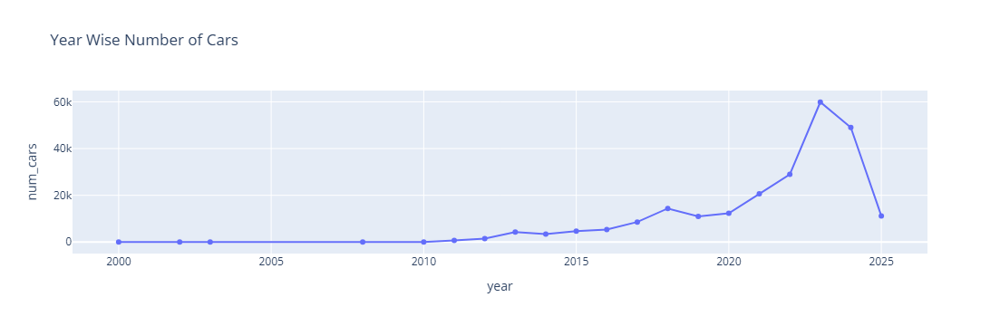

In [130]:
year_wise_cars = df.groupby('Model Year')['VIN (1-10)'].count().reset_index()
year_wise_cars.columns = ['year','num_cars']

fig = px.line(year_wise_cars,x="year", y="num_cars", title='Year Wise Number of Cars',markers=True)
fig.show()

**The number of cars remained nearly flat from 2000 to around 2010, indicating minimal growth.**

**A gradual rise began post-2010, with noticeable acceleration around 2016.**

**A sharp surge occurred between 2021 and 2023, peaking in 2023 with about 60,000 cars.**

**There was a drop in 2024, with car numbers falling to around 50,000.**

**A steep decline followed in 2025, dropping to under 15,000 cars.**

## What are the trends of Car Company's production of electric vehicles?
**Scatter Plot**

In [133]:
fig = px.scatter(df, x="Model Year", y="Electric Range", size="Model Year", color="Make",
                 title="Electric Range Trends")
fig.show()

**Electric vehicle range has steadily increased over the years, especially post-2015. Tesla consistently leads with the highest electric range across model years.**